# Swinging Atwood's Machine
![Atwood's Machine](https://upload.wikimedia.org/wikipedia/commons/thumb/c/cb/Swinging_Atwoods_Machine.svg/1920px-Swinging_Atwoods_Machine.svg.png)

In this notebook, we will explore the dynamics of an Swinging Atwood's Machine. The Atwood's Machine is a simple device that can be used to demonstrate the conservation of mechanical energy. The figure below shows a simple Atwood's Machine with two masses $m_1$ and $m_2$ connected by a light inextensible string of length $l$.

## Problem Statement

We have two masses $m_1$ and $m_2$ connected by a light inextensible string of length $L$. One of the masses oscillates as a simple pendulum but its length can change as the length of the other mass change. The other mass only can move up and down. The total length is constant. So we have the following parameters:

* $m_1$: mass of the pendulum
* $m_2$: mass of the other mass
* $l_1$: length of the pendulum
* $l_2$: length of the other mass
* $L$: length of the string
* $g$: acceleration due to gravity
* $\theta$: angle of the pendulum
* $t$: time

## Library Imports

We will use the following libraries:

* `numpy` for numerical calculations
* `matplotlib` for plotting
* `ipywidgets` for interactive plots
* `IPython.display` for displaying the animation
* `SciPy` for solving the differential equation
* `sympy` for symbolic calculations

In [1]:
%pip install ipywidgets numpy matplotlib scipy sympy --quiet

Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp, odeint
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import HTML
import sympy as sym
from matplotlib import animation, rc
sym.init_printing()

## Define the parameters

In [2]:
m1, m2, l, g= sym.symbols('m_1 m_2 L g', positive=True, real=True, constant=True)
t = sym.symbols('t', real=True, positive=True, constant=False)

# Functions of t
l1 = sym.Function('l_1')(t)
l2 = sym.Function('l_2')(t)
theta = sym.Function('theta')(t)

Now we need to define the positions of the masses:

* Position of the pendulum: 
    $$r_1 = (l_1 \sin \theta, -l_1 \cos \theta)$$

* Position of the other mass:
    $$r_2 = (L, -l_2) = (L, -L + l_1)$$

and we theses positions we can define the velocity of the masses

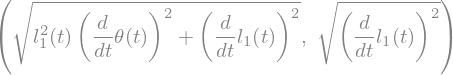

In [3]:
## Mass 1 position
x1 = l1 * sym.sin(theta)
y1 = -l1 * sym.cos(theta)

## Mass 2 position
x2 = l 
y2 = l1

## Mass 1 velocity
vx1 = x1.diff(t)
vy1 = y1.diff(t)

## Mass 2 velocity
vx2 = x2.diff(t)
vy2 = y2.diff(t)

## Mass 1 velocity magnitude
v1 = sym.sqrt(vx1**2 + vy1**2).simplify()

## Mass 2 velocity magnitude
v2 = sym.sqrt(vx2**2 + vy2**2).simplify()

v1, v2

Now we can define the kinetic and potential energy of the system:

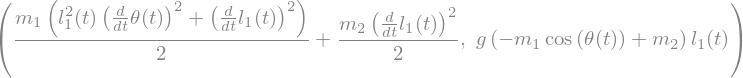

In [4]:
# Kinetic energy of mass 1
T1 = sym.Rational(1,2) * m1 * v1**2

# Kinetic energy of mass 2
T2 = sym.Rational(1,2) * m2 * v2**2

# Potential energy of mass 1
V1 = m1 * g * y1

# Potential energy of mass 2
V2 = m2 * g * y2

# Total kinetic energy
T = (T1 + T2).simplify()

# Total potential energy
V = (V1 + V2).simplify()

T, V

So, we define the Lagrangian of the system:

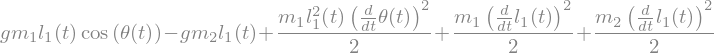

In [5]:
L = sym.simplify(T - V)
L.expand()

Then, we can define the equations of motion using the Euler-Lagrange equations:

$$ \frac{d}{dt} \frac{\partial L}{\partial \dot{q}} - \frac{\partial L}{\partial q} = 0 $$

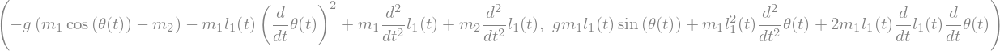

In [6]:
## Equations of motion for the l1
LE1 = sym.diff(L.diff(l1.diff(t)), t) - L.diff(l1)

## Equations of motion for the l2
LE2 = sym.diff(L.diff(theta.diff(t)), t) - L.diff(theta)

LE1, LE2

We solve the equations of motion for the accelerations:

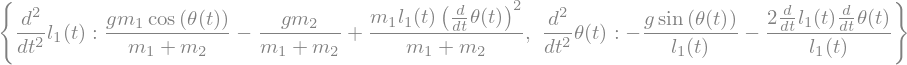

In [21]:
sols = sym.solve([LE1, LE2], [l1.diff(t).diff(t), theta.diff(t).diff(t)])

sols

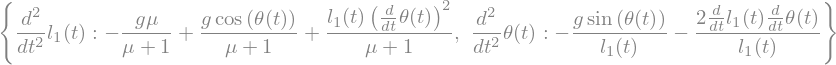

In [20]:
# Define mass ratio
mu = sym.symbols('mu', positive=True, real=True, constant=True)


# Rewrite the solutions in terms of the mass ratio
sols = {l1.diff(t).diff(t): sols[l1.diff(t).diff(t)].subs(m2, mu*m1).subs(m1, (1+mu)*m1).simplify().expand(),
        theta.diff(t).diff(t): sols[theta.diff(t).diff(t)].subs(m2, mu*m1).subs(m1, (1+mu)*m1).simplify().expand()}

sols

In order to solve the equations of motion, we need to decompose the equations of motion in two sets of equations, one for the pendulum and one for the other mass. We can do this by defining the following variables:

* $\displaystyle\omega = \frac{d \theta}{dt}$
* $\displaystyle v = \frac{d l_1}{dt}$
* $\displaystyle\frac{d \omega}{dt} = ...$
* $\displaystyle\frac{d v}{dt} = ...$

Then, we can define the equations of motion:

Now that we have the equations of motion, we can solve them numerically using `SciPy`. So first to make lambdas functions for the equations of motion:

In [22]:
dwdt_f = sym.lambdify((t, m1, m2, g, l1, theta, theta.diff(t), l1.diff(t)), sols[theta.diff(t).diff(t)])
dvdt_f = sym.lambdify((t, m1, m2, g, l1, theta, theta.diff(t), l1.diff(t)), sols[l1.diff(t).diff(t)])
dthetadt_f = sym.lambdify(theta.diff(t), theta.diff(t))
dldt_f = sym.lambdify(l1.diff(t), l1.diff(t))

To make the code readable, we define the following functions:

In [23]:
def dSdt(t, S, g, m_1, m_2, L):
    theta, l1, w, v = S
    return [dthetadt_f(w), dldt_f(v), dwdt_f(t, m_1, m_2, g, l1, theta, w, v), dvdt_f(t, m_1, m_2, g, l1, theta, w, v)]

We can now solve the equations of motion using `SciPy`, but first we need to define the initial conditions:

In [97]:
time = np.arange(0, 10, 0.001)
# Angle: m2/m1
S0 = [np.pi/2, 1, 0, 0]
sol = solve_ivp(dSdt, [0, 10], S0, args=(9.81, 1, 1, 1), t_eval=time, method='RK45', atol=1e-6, rtol=1e-6)
sol = sol.y
# Round to 2 decimal places
theta = np.round(sol[0], 1)
l1 = np.round(sol[1], 1)
w = np.round(sol[2], 1)
v = np.round(sol[3], 1)
(1-(5/1))/9.81

We can plot the results:

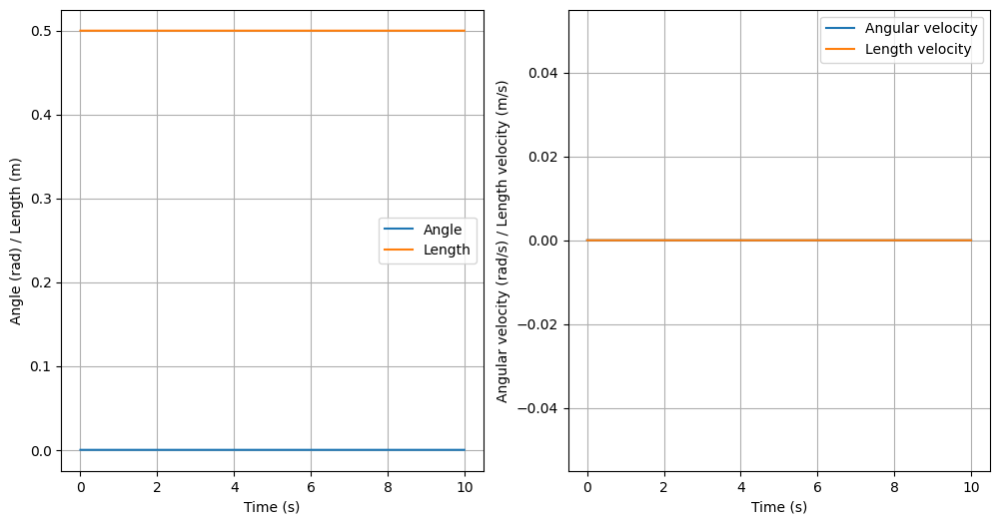

In [98]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].plot(time, theta)
ax[0].plot(time, l1)
ax[0].set_xlabel('Time (s)')
ax[0].set_ylabel('Angle (rad) / Length (m)')
ax[0].legend(['Angle', 'Length'])
ax[0].grid()

ax[1].plot(time, w)
ax[1].plot(time, v)
ax[1].set_xlabel('Time (s)')
ax[1].set_ylabel('Angular velocity (rad/s) / Length velocity (m/s)')
ax[1].legend(['Angular velocity', 'Length velocity'])
ax[1].grid()

plt.show()

We can plot the phase space:

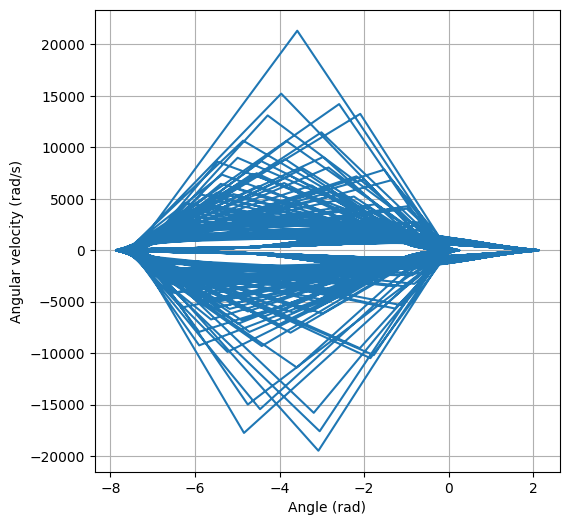

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(theta, w)
ax.set_xlabel('Angle (rad)')
ax.set_ylabel('Angular velocity (rad/s)')
ax.grid()

plt.show()

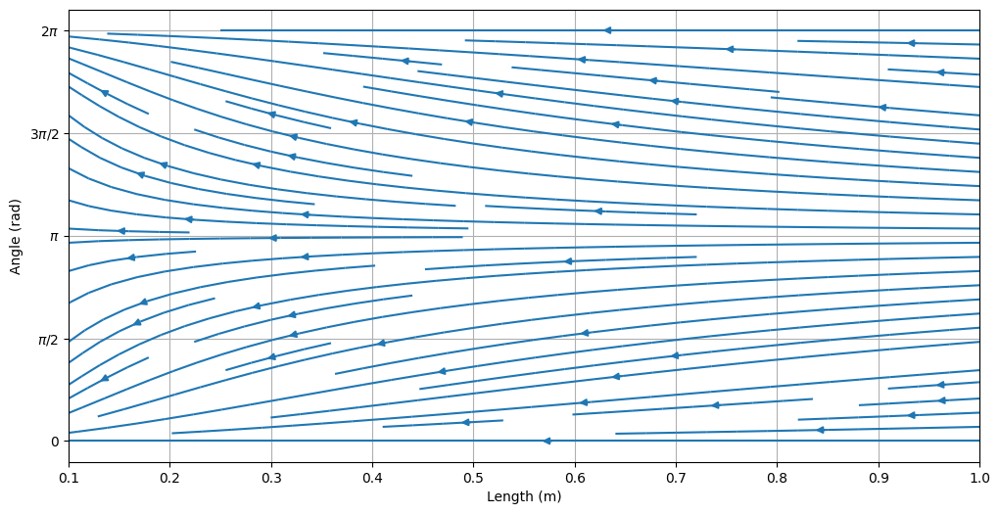

In [99]:
lvalues, thetavalues = np.meshgrid(np.linspace(0.1, 1, 100), np.linspace(0, 2*np.pi, 100))
wvalues = dwdt_f(0, 1, 5, 9.81, lvalues, thetavalues, 0, 0)
vvalues = dvdt_f(0, 1, 5, 9.81, lvalues, thetavalues, 0, 0)

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.streamplot(lvalues, thetavalues, vvalues, wvalues)
ax.set_xlabel('Length (m)')
ax.set_ylabel('Angle (rad)')
# Change x ticks to 0.1, 0.2, ..., 1
ax.set_xticks(np.linspace(0.1, 1, 10))
# Change y ticks to 0, pi/2, pi, 3pi/2, 2pi, and display them as 0, pi/2, pi, 3pi/2, 2pi
ax.set_yticks(np.linspace(0, 2*np.pi, 5), ['0', '$\pi/2$', '$\pi$', '$3\pi/2$', '$2\pi$'])
ax.grid()

plt.show()

We can make an animation of the results:

In [34]:
def xy_coords(S, L):
    theta, l1, w, v = S
    x1 = l1 * np.sin(theta)
    y1 = -l1 * np.cos(theta)
    x2 = L
    y2 = -L + l1
    return x1, y1, x2, y2

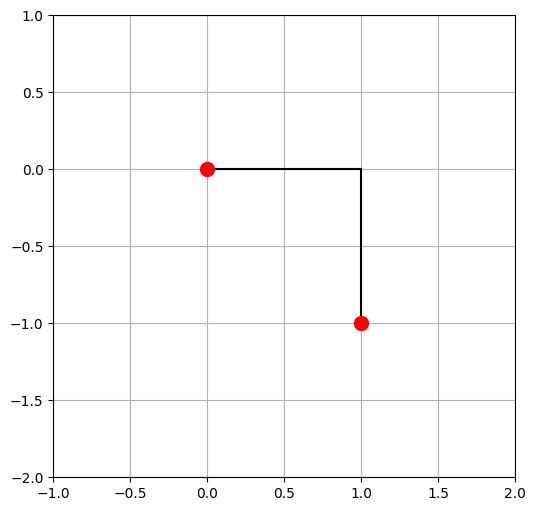

In [63]:
def animate(i):
    ax.clear()
    ax.set_xlim(-1, 2)
    ax.set_ylim(-2, 1)
    ax.set_aspect('equal')
    theta_ = theta[i]
    l1_ = l1[i]
    x1, y1, x2, y2 = xy_coords([theta_, l1_, 0, 0], 1)
    # Line between the two poles
    ax.plot([0, 1], [0, 0], 'k')
    # Line between the mass 1 and the pivot
    ax.plot([0, x1], [0, y1], 'k')
    # Line between the mass 2 and the pivot
    ax.plot([1, x2], [0, y2], 'k')
    # Mass 1
    ax.plot(x1, y1, 'ro', markersize=10)
    # Mass 2
    ax.plot(x2, y2, 'ro', markersize=10)
    ax.grid()

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
anim = animation.FuncAnimation(fig, animate, frames=len(time)//10, interval=10)
HTML(anim.to_jshtml())